# Imports

In [308]:
import phoebe
from phoebe import u, c

import scienceplots
import matplotlib.pyplot as plt
plt.style.use("science")

import os
import sys
from pathlib import Path
baseModulePath = str(Path(os.getcwd()).parents[2].absolute())
if baseModulePath not in sys.path:
	sys.path.append(baseModulePath)

import importlib
import analisis.phoebe_model.utils as gen_utils
import analisis.phoebe_model.sampling.mcmc_utils as mcmc_utils
importlib.reload(gen_utils)
importlib.reload(mcmc_utils)

logger = phoebe.logger(clevel='WARNING')

# Utility Variables

In [309]:
gaiaDatasets = ['lcGaiaG', 'lcGaiaRP', 'lcGaiaBP']
iturbideDatasets = ['lcIturbide']
ztfDatasets = ['lcZtfG', 'lcZtfR']
allDatasets = gaiaDatasets + iturbideDatasets + ztfDatasets
plotAllDatasetsGroups = [iturbideDatasets, gaiaDatasets, ztfDatasets]

# Load Post-Optimizers Bundle

In [310]:
# b = phoebe.load("../optimizers/bundle-saves/poro-aviles-invq/after_optimizers")
# b = phoebe.load("../optimizers/bundle-saves/iturbide-gaia-ztf-relative_norm/post-optimizers")
# b = phoebe.load("../optimizers/bundle-saves/iturbide-gaia-ztf-relative_norm/post-optimizers")
# b = gen_utils.loadBundle(bundleName="post-optimizers", subfolder="updated-data", parentFolder="../optimizers")
b = gen_utils.loadBundle(bundleName="sigma_cleaned_ztf_updated_data")

In [311]:
print(b['ebv'])
print(b['Av'])
print(b['Rv'])

ParameterSet: 2 parameters
C                      ebv@system: 0.0
                   ebv@constraint: {Av@system} / {Rv@system}
Parameter: Av@system
                       Qualifier: Av
                     Description: Extinction Av
                           Value: 0.0
                  Constrained by: 
                      Constrains: ebv@system
                      Related to: Rv@system, ebv@system

Parameter: Rv@system
                       Qualifier: Rv
                     Description: Extinction law parameter
                           Value: 3.1
                  Constrained by: 
                      Constrains: ebv@system
                      Related to: Av@system, ebv@system



# Increase Mesh Triangles

From preeliminary testing of sampling can see that some iterations failed due to the mesh not having high enough resolution.

In [312]:
print(b['ntriangles'])
b.set_value(qualifier='ntriangles', value=6500)
print(b['ntriangles'])

Parameter: ntriangles@contact_envelope@phoebe01@compute
                       Qualifier: ntriangles
                     Description: Requested number of triangles (won't be exact).
                           Value: 5000
                  Constrained by: 
                      Constrains: None
                      Related to: None
                 Only visible if: mesh_method:marching,hierarchy.is_meshable:true

Parameter: ntriangles@contact_envelope@phoebe01@compute
                       Qualifier: ntriangles
                     Description: Requested number of triangles (won't be exact).
                           Value: 6500
                  Constrained by: 
                      Constrains: None
                      Related to: None
                 Only visible if: mesh_method:marching,hierarchy.is_meshable:true



# Renaming Datasets

Getting dataset names to play nice with plotting; math latex parser errors out with `lc_gaia_g_raw` due to 2 consecutive underscores (`_g` part probably).

In [313]:
%%script echo "skipping; already renamed datasets"
originalDatasets = [d for d in b.datasets if d != 'mesh01' and 'Ztf' not in d]
originalDatasets

skipping; already renamed datasets


In [314]:
%%script echo "skipping; already renamed datasets"
b.add_dataset('lc', dataset='lcIturbide', overwrite=True, pblum_mode='dataset-scaled',
			  times=b.get_value(qualifier='times', dataset='lc_iturbide_norm', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_iturbide_norm', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_iturbide_norm', context='dataset'))

b.add_dataset('lc', dataset='lcGaiaG', overwrite=True, passband='Gaia:G', 
			  times=b.get_value(qualifier='times', dataset='lc_gaia_g_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_g_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_g_raw', context='dataset'),
			  pblum_mode='component-coupled', pblum=b.get_value(qualifier='pblum', dataset='lc_gaia_g_raw'))
b.add_dataset('lc', dataset='lcGaiaRP', overwrite=True, passband='Gaia:RP',
			  times=b.get_value(qualifier='times', dataset='lc_gaia_rp_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_rp_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_rp_raw', context='dataset'),
			  pblum_mode='dataset-coupled', pblum_dataset='lcGaiaG')
b.add_dataset('lc', dataset='lcGaiaBP', overwrite=True, passband='Gaia:BP',
			  times=b.get_value(qualifier='times', dataset='lc_gaia_bp_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_bp_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_bp_raw', context='dataset'),
			  pblum_mode='dataset-coupled', pblum_dataset='lcGaiaG')

skipping; already renamed datasets


In [315]:
%%script echo "skipping; already renamed datasets"
for d in iturbideDatasets + gaiaDatasets:
    b.flip_constraint(f"compute_phases@{d}", solve_for=f"compute_times@{d}")

skipping; already renamed datasets


In [316]:
%%script echo "skipping; already renamed datasets"
datasetsNewNames = {
    'lc_gaia_g_raw': 'lcGaiaG',
    'lc_gaia_rp_raw': 'lcGaiaRP',
    'lc_gaia_bp_raw': 'lcGaiaBP',

    'lc_iturbide_norm': 'lcIturbide'
}

for oldName, newName in datasetsNewNames.items():
    b.set_value(qualifier='compute_phases', dataset=newName, value=b.get_value(qualifier='compute_phases', dataset=oldName, context='dataset'))

skipping; already renamed datasets


100%|██████████| 104/104 [00:48<00:00,  2.14it/s]


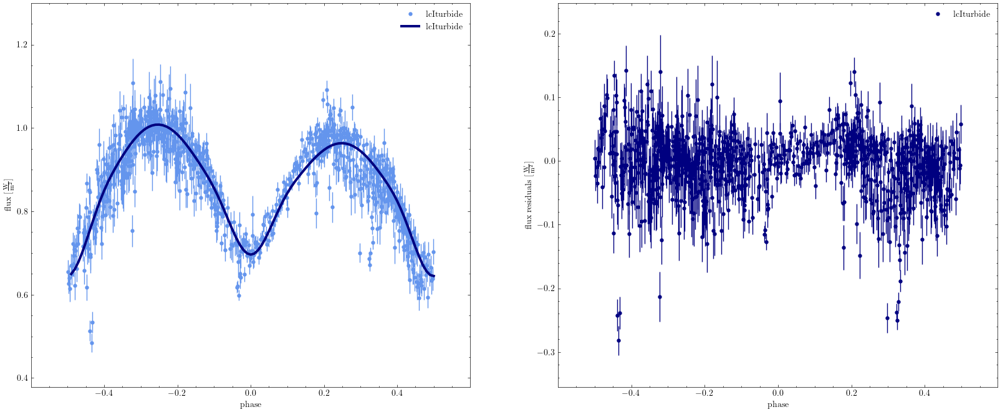

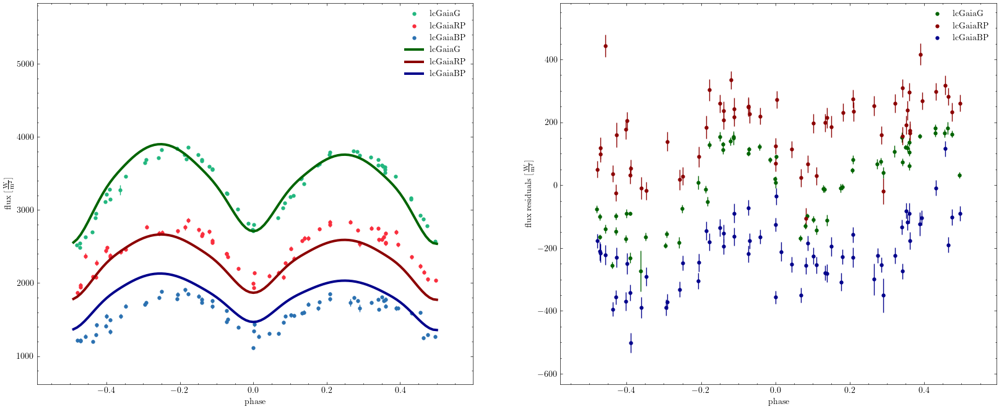

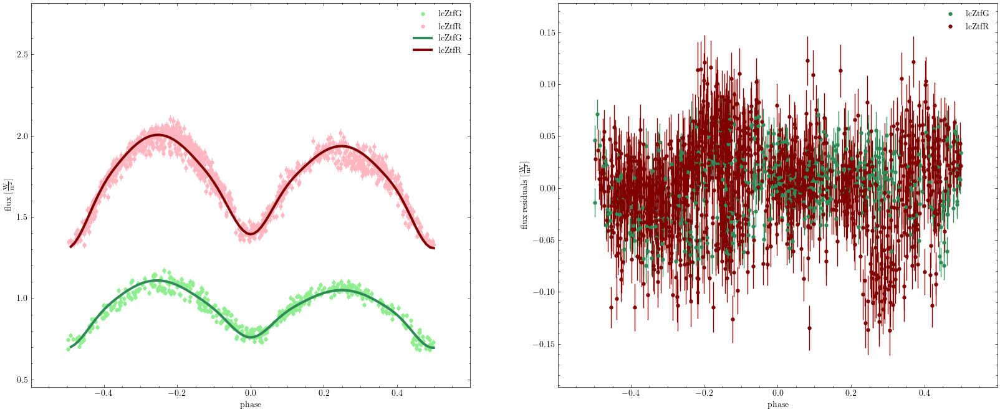

<Figure size 800x600 with 0 Axes>

In [317]:
gen_utils.abilitateDatasets(b, allDatasets)
b.run_compute(model='after_opt', overwrite=True)
gen_utils.plotModelResidualsFigsize(b, (20, 8), plotAllDatasetsGroups, model='after_opt')
gen_utils.animateMesh(b, logger, model='after_opt')

Sat, 03 Aug 2024 13:13 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.109282, assuming named color
Sat, 03 Aug 2024 13:13 PARAMETERS   WARNING could not find Parameter match for ec=face at time=00.109282, assuming named color


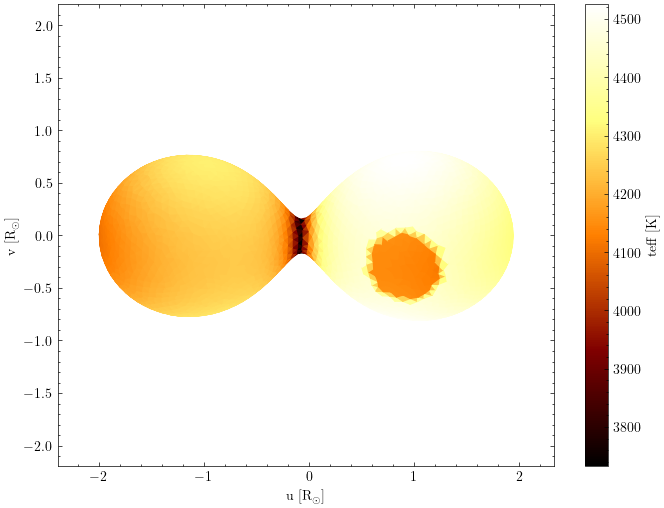

(<autofig.figure.Figure | 1 axes | 2 call(s)>,
 <Figure size 800x600 with 2 Axes>)

In [318]:
b.plot(show=True, dataset='mesh01', model='after_opt', phase=0.25, fc='teffs', ec='face', draw_sidebars=True)

In [319]:
%%script echo "skipping; already renamed datasets"
for d in originalDatasets:
	b.remove_dataset(d)

skipping; already renamed datasets


In [320]:
b.datasets

['mesh01', 'lcGaiaG', 'lcGaiaRP', 'lcGaiaBP', 'lcIturbide', 'lcZtfG', 'lcZtfR']

# Creating Uniform Boundary Distributions

Restricting sampler parameter space; not prescribing a shape to the parameter distribution, only interested in restricting sampler space to decrease compute 
requirements.

In [321]:
print(b.get_adjustable_parameters())

ParameterSet: 53 parameters
                  distance@system: 1.0 m
                    vgamma@system: 0.0 km / s
                        Av@system: 0.0
                        Rv@system: 3.1
           teff@primary@component: 4203.691151764369 K
        syncpar@primary@component: 1.0
      gravb_bol@primary@component: 0.32
   irrad_frac_refl_bol@primary...: 0.6
           mass@primary@component: 0.5707007947192273 solMass
      syncpar@secondary@component: 1.0
    gravb_bol@secondary@component: 0.32
   irrad_frac_refl_bol@seconda...: 0.6
          period@binary@component: 0.3335660396161509 d
            dpdt@binary@component: 0.0 s / yr
          dperdt@binary@component: 0.0 deg / yr
      t0_supconj@binary@component: 0.02589 d
            incl@binary@component: 68.42157 deg
               q@binary@component: 1.10457
         long_an@binary@component: 0.0 deg
           ecosw@binary@component: 0.0
           esinw@binary@component: 0.0
   abun@contact_envelope@compo...: 0.0
   fillo

In [322]:
print(b['secondary_spot'])

ParameterSet: 5 parameters
     colat@secondary_spot@feature: 89.77982832761822 deg
      long@secondary_spot@feature: 81.09965724152116 deg
    radius@secondary_spot@feature: 25.120860294798142 deg
   relteff@secondary_spot@feature: 0.9300685029024329
   enabled@secondary_spot@phoe...: True


In [323]:
print(b['mass'])
print(b['requiv'])
print(b['pot@contact_envelope'])
print(b['sma'])
print(b['fillout_factor'])
print(b['incl@binary'])
print(b['t0_supconj'])

print("==========================================================")
print(b['gravb_bol@primary'])
print(b['abun'])

ParameterSet: 4 parameters
           mass@primary@component: 0.5707007947192273 solMass
C        mass@secondary@component: 0.6303789768230168 solMass
                  mass@constraint: (39.478418 * ({sma@binary@component} ** 3.000000)) / ((({period@binary@component} ** 2.000000) * ((1.000000 / {q@binary@component}) + 1.000000)) * 2942.206217504419328179210424423218)
   mass@poro_porb_bounds@distr...: <distl.uniform low=1.0683296468664136 high=1.1763645528088365 unit=solMass label=mass@primary label_latex=$M_\mathrm{ primary }$>
ParameterSet: 4 parameters
C        requiv@primary@component: 0.8142169557407092 solRad
C      requiv@secondary@component: 0.8518091290501311 solRad
        requiv@primary@constraint: pot_to_requiv_contact({pot@contact_envelope@component}, {q@binary@component}, {sma@binary@component}, 1)
      requiv@secondary@constraint: pot_to_requiv_contact({pot@contact_envelope@component}, {q@binary@component}, {sma@binary@component}, 2)
ParameterSet: 2 parameters
C  pot@co

In [326]:
b.add_distribution({
	'teff@primary': phoebe.uniform_around(200),
	'teffratio': phoebe.uniform_around(0.3),
	'fillout_factor': phoebe.uniform(0.03, 0.25), # avoiding ff <= 0, since this is not valid for CBS
	'incl@binary': phoebe.uniform_around(10),
	'q': phoebe.uniform_around(0.5)	
}, distribution='bounds_around', overwrite_all=True)

b.add_distribution({
	'period@binary': phoebe.uniform_around(0.5),
	't0_supconj': phoebe.uniform_around(0.1)
}, distribution='bounds_porb', overwrite_all=True)

b.add_distribution({
	'colat@secondary_spot': phoebe.uniform_around(15),
	'long@secondary_spot': phoebe.uniform_around(15),
	'radius@secondary_spot': phoebe.uniform_around(8),
	'relteff@secondary_spot': phoebe.uniform_around(0.4)
}, distribution='bounds_secondary_spot', overwrite_all=True)

# b.add_distribution({
# 	'pblum@primary@lcGaiaG': phoebe.uniform_around(5000)
# }, distribution='bounds_pblum_gaia_g', overwrite_all=True)

b.add_distribution({
	'pblum@primary@lcZtfG': phoebe.uniform_around(2)
}, distribution='bounds_pblum_ztf_g', overwrite_all=True)

<ParameterSet: 1 parameters>

In [430]:
# TODO: try to figure out how to replace latex labels
distCollection, twigs = b.get_distribution_collection("bounds_around", set_labels=True)
# distCollection[0].labels_latex = [r"$T_{eff,1}"]
distCollection.labels_latex[0] = "$T_1$"
print(distCollection.labels_latex)

['$T_{ \\mathrm{ eff }, \\mathrm{ primary } }$', '$T_\\mathrm{ eff, secondary } / T_\\mathrm{ eff, primary }$', '$\\mathrm{FF}_\\mathrm{ contact_envelope }$', '$i_\\mathrm{ binary }$', '$q_\\mathrm{ binary }$']


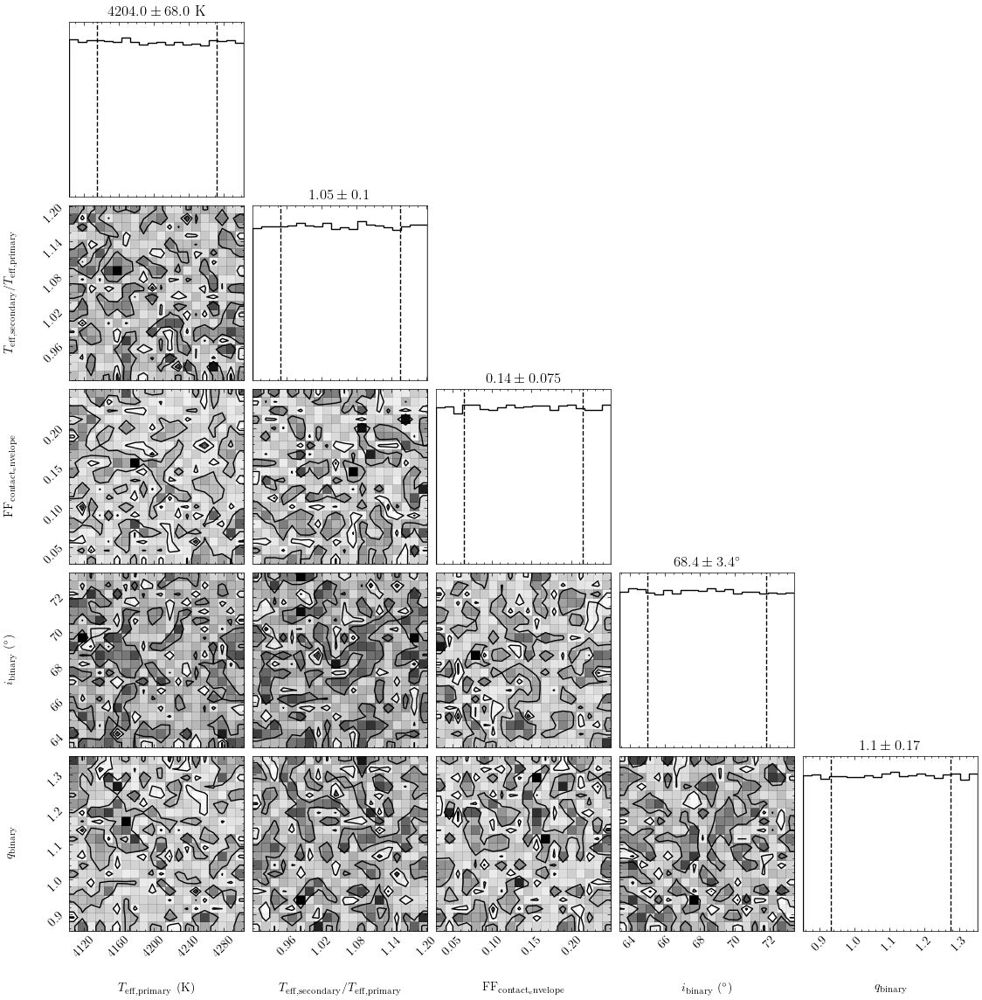

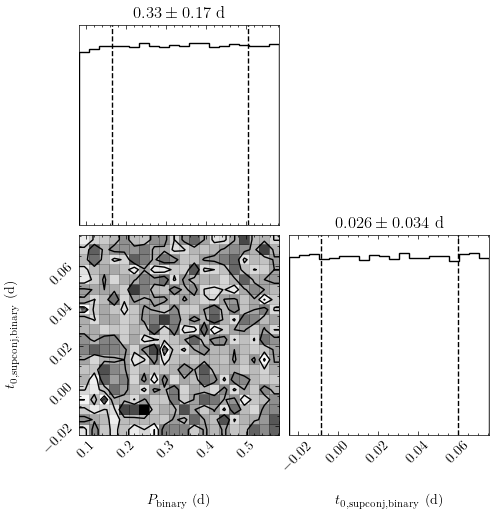

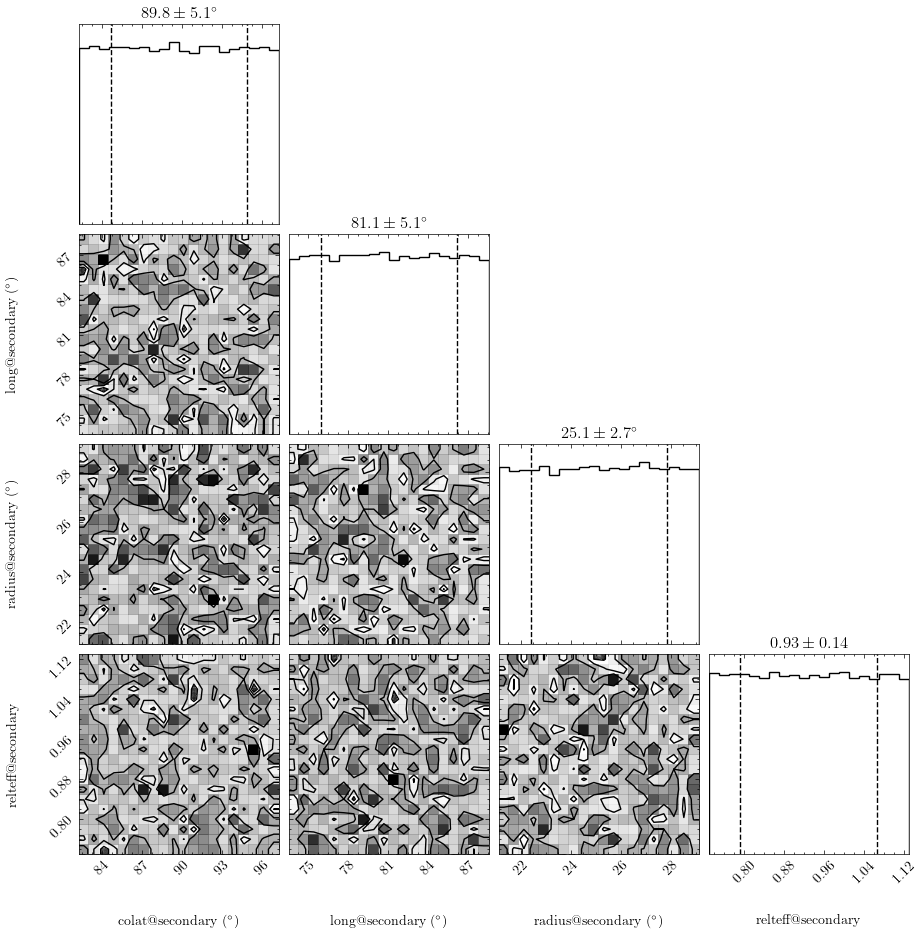

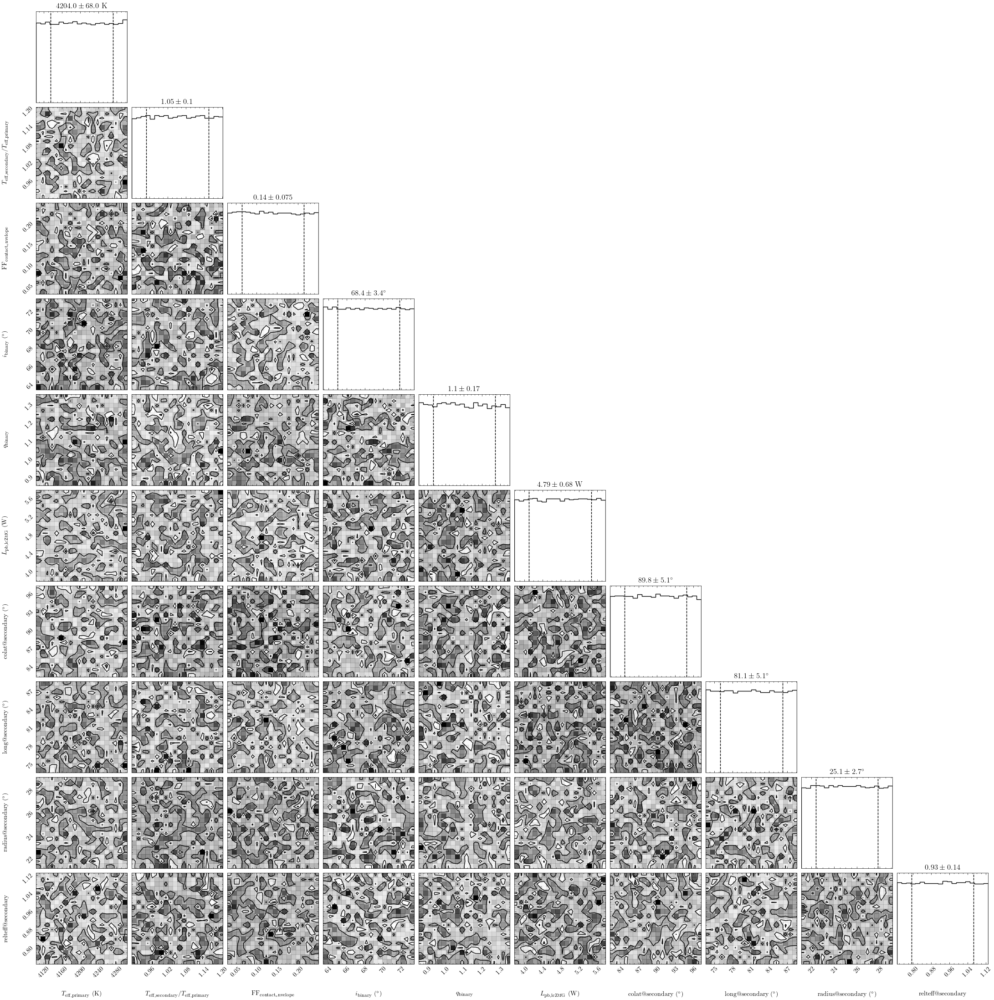

In [327]:
_ = b.plot_distribution_collection('bounds_around', show=True)
_ = b.plot_distribution_collection('bounds_porb', show=True)
_ = b.plot_distribution_collection('bounds_secondary_spot', show=True)
_ = b.plot_distribution_collection(['bounds_around', 'bounds_pblum_ztf_g', 'bounds_secondary_spot'], show=True)

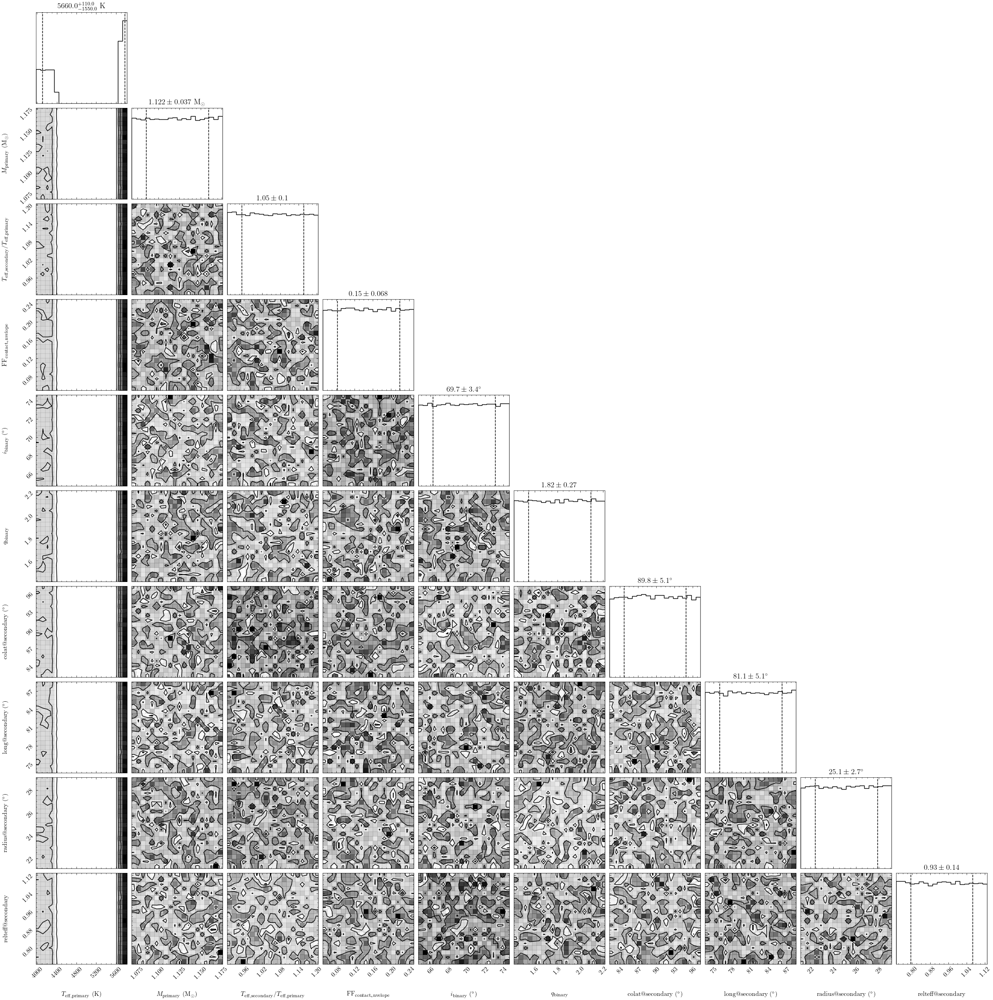

In [ ]:
_ = b.plot_distribution_collection(['poro_porb_bounds', 'bounds_around', 'bounds_secondary_spot'], combine='or', show=True)

# ZTF Sampling

In [328]:
b.models

['after_opt']

In [329]:
mcmc_utils.exportSampler(b, sampler_solver='mcmc_ztf', subfolder='updated-data', datasets=ztfDatasets, 
			  	init_from=['bounds_around', 'bounds_pblum_ztf_g', 'bounds_secondary_spot'], nwalkers=160, niters=40000, progress_every_niters=5)
print(b['mcmc_ztf'])

mcmc_ztf | external-jobs/updated-data/mcmc_ztf.py | results/mcmc_ztf
ParameterSet: 15 parameters
         comments@mcmc_ztf@solver: 
       use_server@mcmc_ztf@solver: compute
          compute@mcmc_ztf@solver: phoebe01
    continue_from@mcmc_ztf@solver: None
        init_from@mcmc_ztf@solver: ['bounds_around', 'bounds_pblum_ztf_g', 'bounds_secondary_spot']
   init_from_combine@mcmc_ztf@...: first
   init_from_requires@mcmc_ztf...: ['limits', 'priors']
           priors@mcmc_ztf@solver: []
         nwalkers@mcmc_ztf@solver: 160
           niters@mcmc_ztf@solver: 40000
    burnin_factor@mcmc_ztf@solver: 2.0
      thin_factor@mcmc_ztf@solver: 0.0
     nlags_factor@mcmc_ztf@solver: 3.0
   progress_every_niters@mcmc_...: 5
    expose_failed@mcmc_ztf@solver: True


In [417]:
# ~94 hours for previous updated-data sampler (375 iterations) (for 192 walkers)

b.import_solution(fname="./external-jobs/updated-data/in-progress/mcmc_ztf.progress", overwrite=True)
print(b['mcmc_ztf_solution@burnin'])
mcmc_utils.printParameterAutocorrTimes(b, solution='mcmc_ztf_solution')

Parameter: burnin@mcmc_ztf_solution@solution
                       Qualifier: burnin
                     Description: burnin to use when adopting/plotting the solution
                           Value: 48
                  Constrained by: 
                      Constrains: None
                      Related to: None

Parameter autocorrelation times | Iterations: 190 | Avg. autocorr time: 20.450975485603212 | Avg. IIDs: 9.290510378527102
-------------------------------------------------------------------------------------------------------------------------
teff@primary@star@component 16.070793103456584 | 11.822689694084474
teffratio@binary@orbit@component 14.582461630683563 | 13.029350243597632
fillout_factor@contact_envelope@envelope@component 24.17131746203432 | 7.86055622737285
incl@binary@orbit@component 15.977766800839323 | 11.891524164066482
q@binary@orbit@component 23.263004300941695 | 8.167474739808595
pblum@primary@lcZtfG@lc@dataset 22.570232253584273 | 8.418167693858223
col

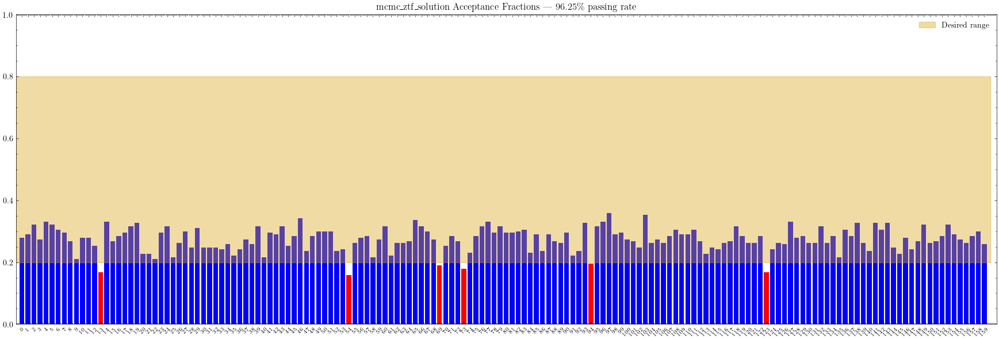

In [418]:
mcmc_utils.plotSamplerAcceptanceFractions(b, sampler_solution='mcmc_ztf_solution', min_acceptable=0.2)

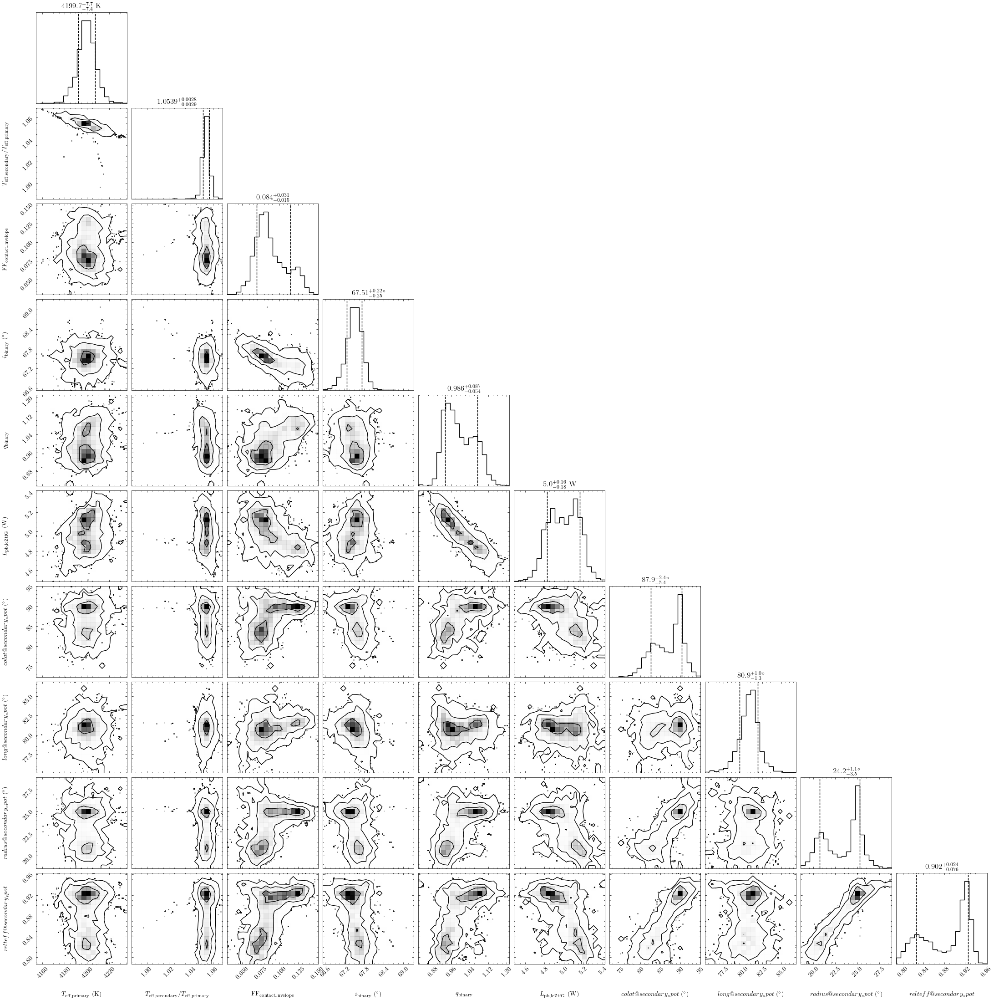

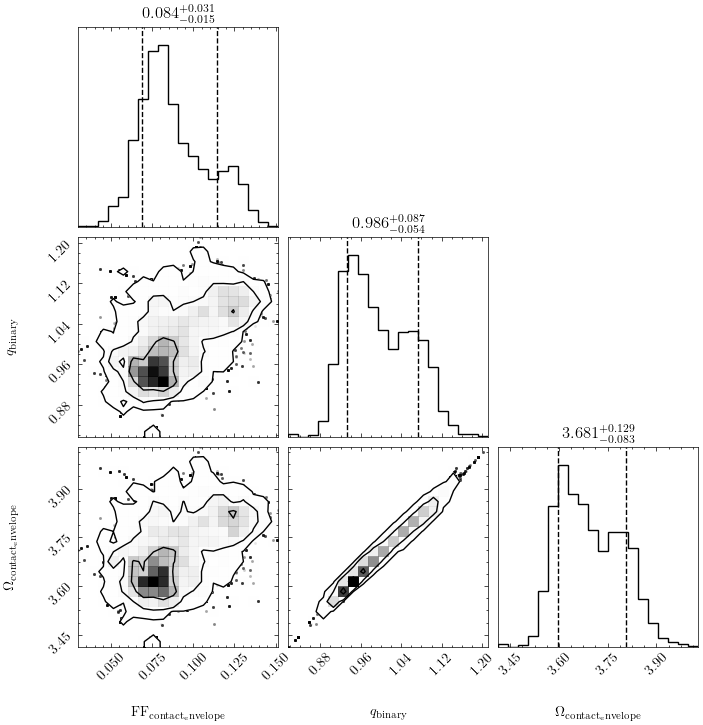

In [419]:
_ = b.plot(solution='mcmc_ztf_solution', style='corner', show=True)
_ = b.plot(solution='mcmc_ztf_solution', style='corner', show=True, parameters=['q', 'pot', 'fillout_factor'])

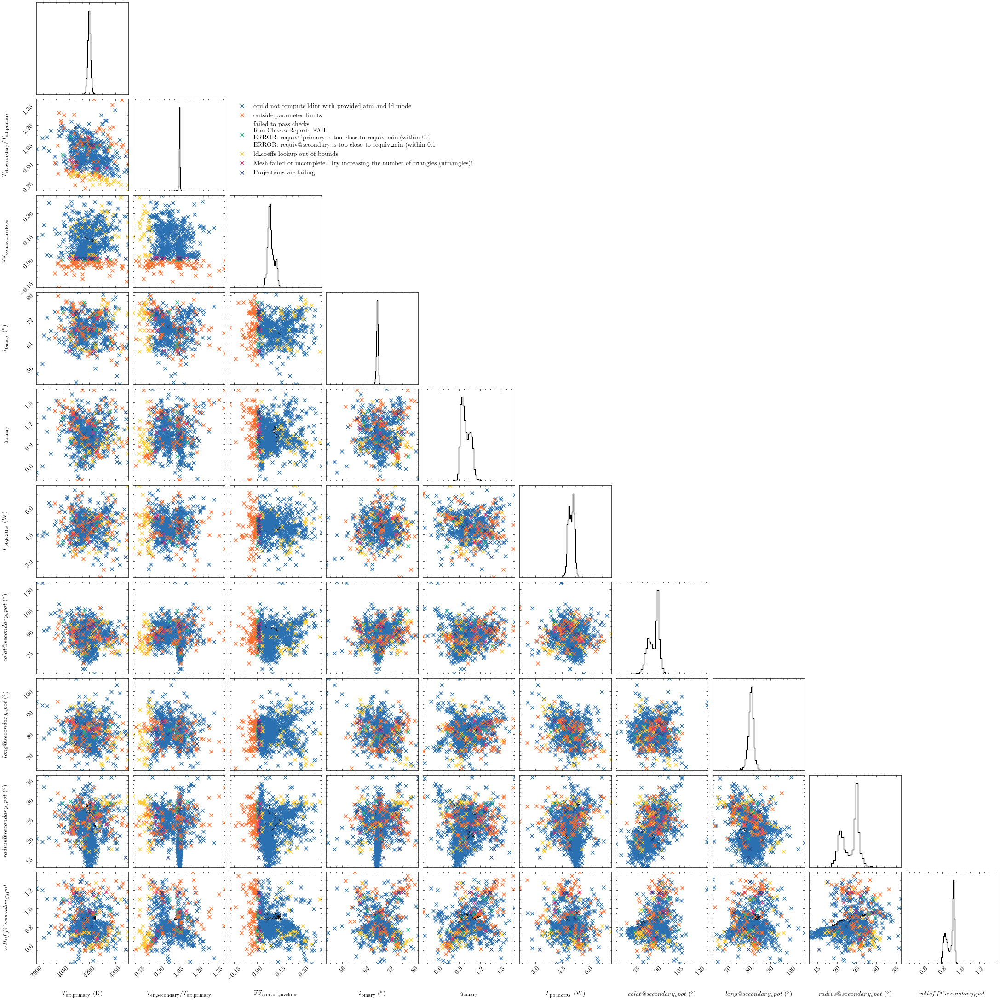

In [420]:
_ = b.plot(solution='mcmc_ztf_solution', style='failed', show=True)


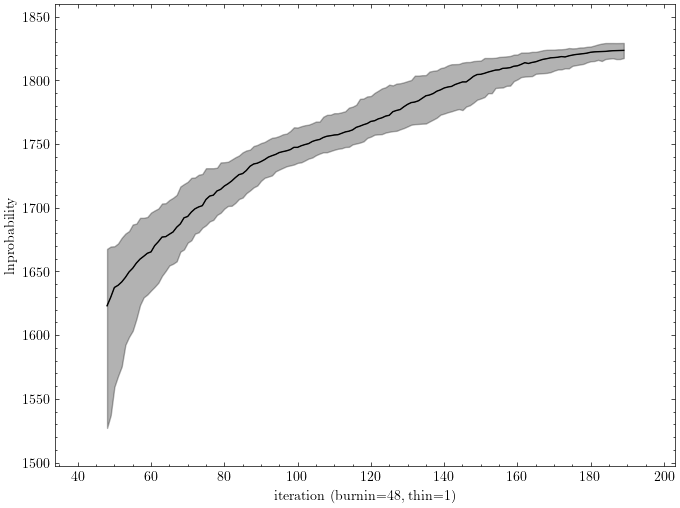

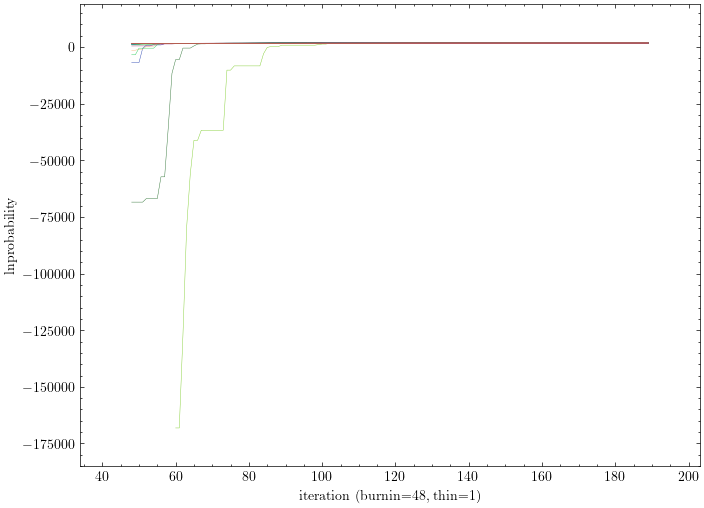

(<autofig.figure.Figure | 1 axes | 160 call(s)>,
 <Figure size 800x600 with 1 Axes>)

In [421]:
b.plot(solution='mcmc_ztf_solution', style='lnprobabilities_spread', show=True, s=0.002)
b.plot(solution='mcmc_ztf_solution', style='lnprobabilities', show=True, s=0.002)

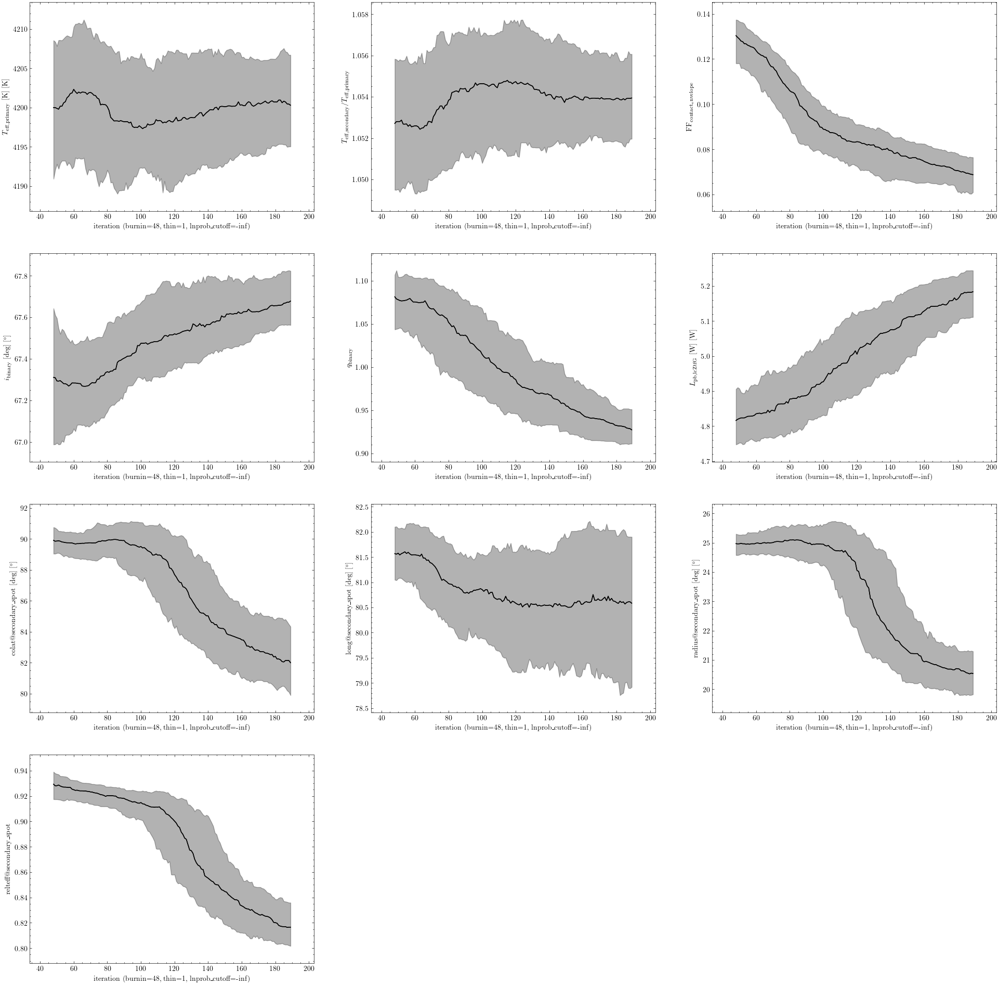

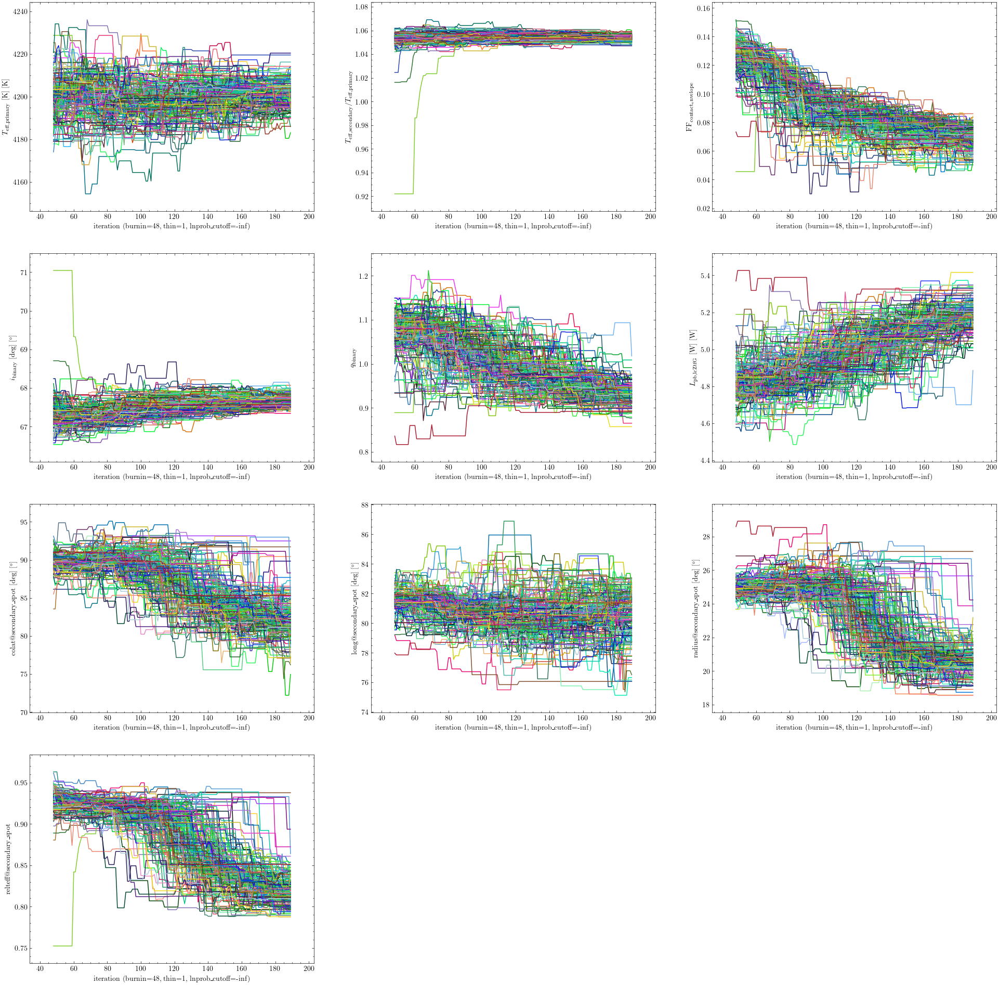

(<autofig.figure.Figure | 10 axes | 1600 call(s)>,
 <Figure size 2400x2400 with 10 Axes>)

In [422]:
b.plot(solution='mcmc_ztf_solution', style='trace_spread', show=True, s=0.002)
b.plot(solution='mcmc_ztf_solution', style='trace', show=True, s=0.002)

In [423]:
gen_utils.abilitateDatasets(b, ztfDatasets)
gen_utils.exportCompute(b, model='mcmc_ztf_sample_model', datasets=ztfDatasets, subfolder='updated-data', 
						sample_from='mcmc_ztf_solution', sample_num=50, overwrite=True)

In [424]:
# %%script echo "skipping until adequately sampled"
b.import_model(fname="./external-compute/updated-data/results/mcmc_ztf_sample_model.model", overwrite=True)

<ParameterSet: 10 parameters | datasets: lcZtfR, lcZtfG>

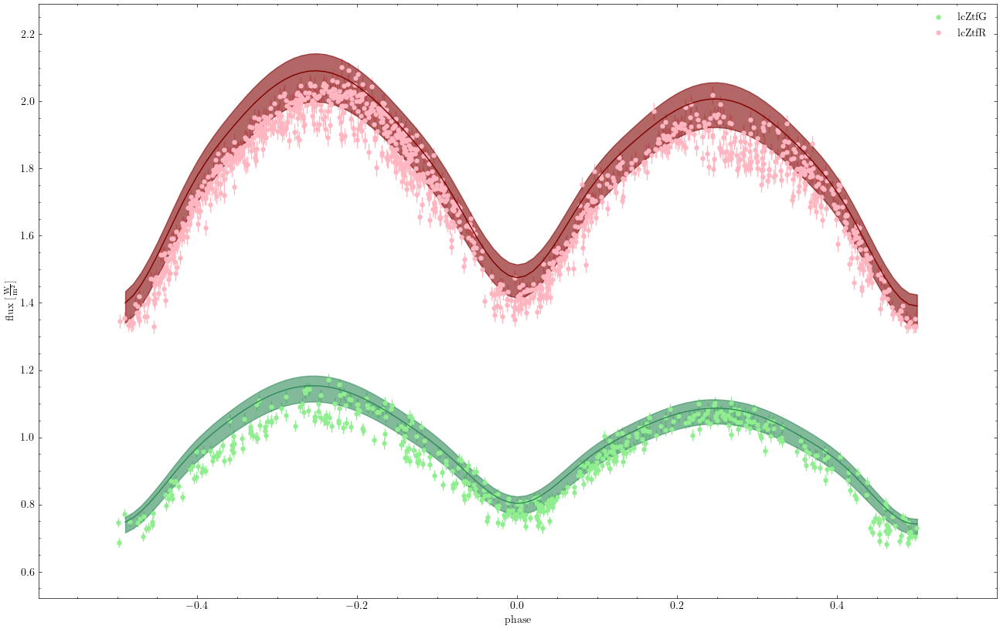

/home/ramon/anaconda3/envs/mapta-tesis/lib/python3.12/site-packages/phoebe/dependencies/autofig/call.py:1305: UserWarning: You passed a edgecolor/edgecolors ('none') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  artist = ax.scatter(*datapoint,


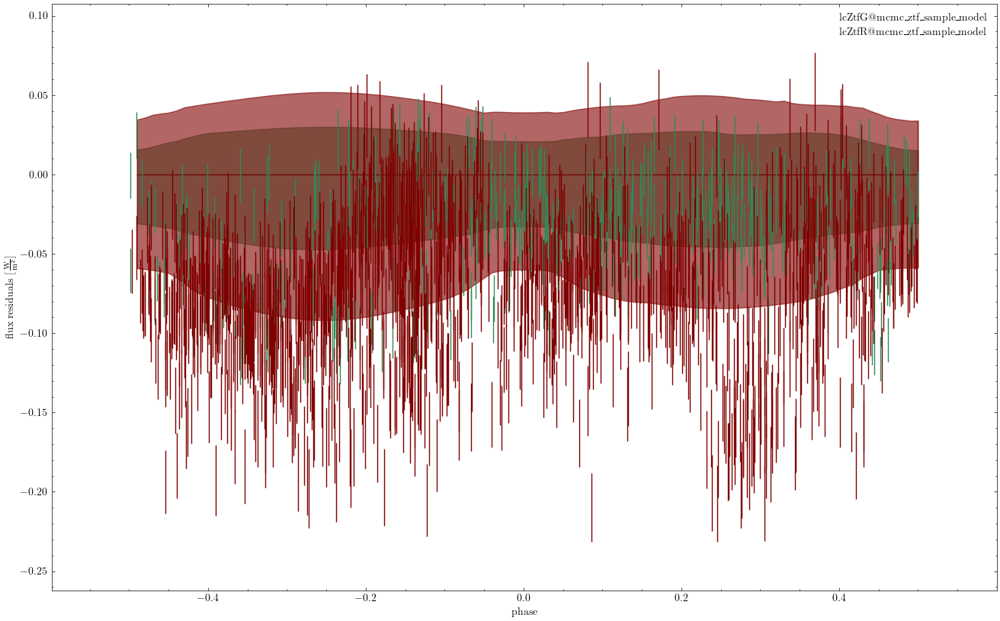

(<autofig.figure.Figure | 1 axes | 4 call(s)>,
 <Figure size 1600x1000 with 1 Axes>)

In [425]:
# %%script echo "skipping until adequately sampled"
b.plot(x='phase', model='mcmc_ztf_sample_model', show=True, legend=True, marker={'dataset': '.'}, s=0.008, c=gen_utils.ZTF_PLOT_COLORS, fig=plt.figure(figsize=(16, 10)))
b.plot(x='phase', y='residuals', model='mcmc_ztf_sample_model', show=True, legend=True, marker={'dataset': '.'}, s=0.008, c=gen_utils.ZTF_PLOT_COLORS, fig=plt.figure(figsize=(16, 10)))

In [426]:
b.models

['after_opt', 'mcmc_ztf_sample_model']

In [427]:
# %%script echo "skipping until adequately sampled"
b.calculate_lnlikelihood(model='mcmc_ztf_sample_model')

-6057.917408368695

In [428]:
b.calculate_lnlikelihood(model='after_opt', dataset=ztfDatasets)

1688.850318062367

In [429]:
b.uncertainties_from_distribution_collection('mcmc_ztf_solution', tex=True)

teff@primary = 4199.7 +7.7 -7.4  K
teffratio@binary = 1.0539 +0.0028 -0.0029  
fillout_factor@contact_envelope = 0.084 +0.031 -0.015  
incl@binary = 67.51 +0.22 -0.25  deg
q@binary = 0.986 +0.087 -0.054  
pblum@lcZtfG = 5.0 +0.16 -0.18  W
colat@secondary_spot = 87.9 +2.4 -5.4  deg
long@secondary_spot = 80.9 +1.0 -1.3  deg
radius@secondary_spot = 24.2 +1.1 -3.5  deg
relteff@secondary_spot = 0.902 +0.024 -0.076  